# Pipeline

## Imports

In [1]:
# Suppression des avertissements liés à Scikit-learn
import warnings  # Masquer les avertissements (ex. : FutureWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Librairies générales
import pandas as pd  # Librairie pour la manipulation de données
import numpy as np  # Librairie pour le calcul numérique
import sys  # Fonctions et variables liées à l'interpréteur Python
import copy  # Création de copies d'objets
from numpy import mean, std  # Fonctions de calcul de moyenne et d'écart type
import zipfile  # Traitement de fichiers zip
import os  # Manipulation de fichiers et chemins

# Librairie affichage
import matplotlib.pyplot as plt  # Outils de visualisation 2D
from matplotlib import pyplot  # Interface de la bibliothèque Matplotlib
import seaborn as sns  # Bibliothèque de visualisation de données basée sur Matplotlib

# Scikit-learn pour l'évaluation des modèles
from sklearn.metrics import confusion_matrix  # Matrice de confusion
from sklearn.model_selection import KFold  # Outils de validation croisée
from sklearn.metrics import accuracy_score  # Calcul de l'accuracy
from sklearn.model_selection import train_test_split  # Découpage train/test

# TensorFlow et Keras
import tensorflow as tf  # Librairie de deep learning
import keras  # API haut niveau pour construire et entraîner des modèles de deep learning
from keras import layers  # Modules de couches pour construire des modèles Keras
from keras import models  # Outils pour créer des modèles Keras
from keras import optimizers  # Outils d'optimisation
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Générateur d'images pour l'augmentation des données
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping  # Rappels pour le suivi et l'arrêt précoce
from keras.layers import Input, Dense, Dropout, Flatten, Lambda  # Types de couches Keras
from keras.layers import Conv2D, MaxPooling2D  # Couches convolutionnelles et de pooling
from keras.preprocessing import image  # Outils de prétraitement d'images
from tensorflow.keras.models import Model, load_model  # Définition / chargement de modèles
from keras.datasets import fashion_mnist  # Jeu de données Fashion MNIST
from tensorflow.keras.utils import to_categorical  # Conversion en encodage one-hot
from tensorflow.keras.optimizers import SGD  # Optimiseur Stochastic Gradient Descent
from tensorflow.keras.applications.resnet50 import ResNet50  # Modèle ResNet50 pré-entraîné
from tensorflow.keras.preprocessing import image  # Prétraitement d'images pour les modèles Keras
from tensorflow.keras import regularizers  # Outils de régularisation pour les modèles Keras

## Datasets

- http://www.lirmm.fr/~poncelet/Ressources/Data_sheep_cat_elephant_with_caption_600.zip

In [2]:

zip_file = "Data_humanface_cat_without_caption_1000.zip"

# Charger les images d'un dossier
data_dir = "./data/dataset/humanface_cat_without_caption_1000/"

os.makedirs('./data/dataset/', exist_ok=True)


#!wget https://www.lirmm.fr/~poncelet/Ressources/cnn_models.zip
!Powershell.exe -Command ((new-object System.Net.WebClient).DownloadFile('https://www.lirmm.fr/~poncelet/Ressources/Data_humanface_cat_without_caption_1000.zip','Data_humanface_cat_without_caption_1000.zip'))

# Extraction du fichier ZIP
with zipfile.ZipFile(zip_file, "r") as zip_ref:
        zip_ref.extractall(data_dir)

# Suppression du fichier ZIP après extraction pour économiser de l'espace
os.remove(zip_file)

In [3]:
batch_size = 32
img_height = 256
img_width = 256



# Charger les images d'un dossier
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images/"
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)



Found 2000 files belonging to 2 classes.
Using 1600 files for training.
Found 2000 files belonging to 2 classes.
Using 400 files for validation.


## Check + Display

In [4]:
class_names = train_ds.class_names
print(class_names)

['cat', 'man']


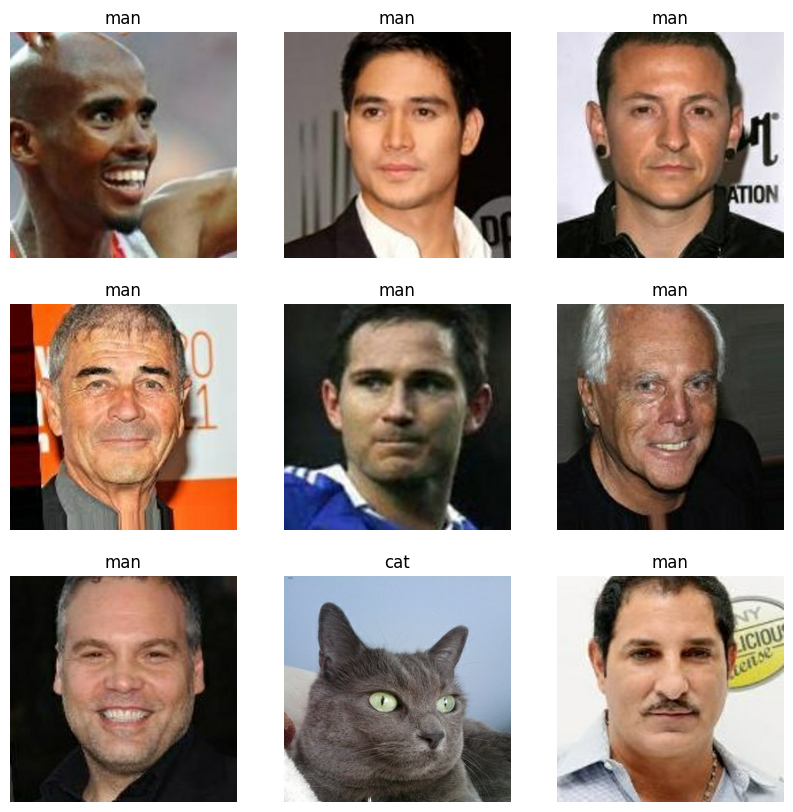

In [5]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [6]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32,)


## Model


In [7]:
def load_dataset():
    train_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir,
        validation_split=0.3,
        subset="training",
        seed=124,
        image_size=(img_height, img_width),
        batch_size=batch_size,
        label_mode="int",
        shuffle=True,
    )

    val_ds = tf.keras.utils.image_dataset_from_directory(
        data_dir,
        validation_split=0.3,
        subset="validation",
        seed=124,
        image_size=(img_height, img_width),
        batch_size=batch_size,
        label_mode="int",
        shuffle=True,
    )

    X_train_list, y_train_list = [], []
    for x, y in train_ds:
        X_train_list.append(x.numpy())
        y_train_list.append(y.numpy())

    X_test_list, y_test_list = [], []
    for x, y in val_ds:
        X_test_list.append(x.numpy())
        y_test_list.append(y.numpy())

    X_train = np.concatenate(X_train_list, axis=0)
    y_train = np.concatenate(y_train_list, axis=0)
    X_test = np.concatenate(X_test_list, axis=0)
    y_test = np.concatenate(y_test_list, axis=0)

    # One-hot
    numClass = len(train_ds.class_names)
    y_train = to_categorical(y_train, num_classes=numClass)
    y_test = to_categorical(y_test, num_classes=numClass)

    return X_train, y_train, X_test, y_test, train_ds.class_names


def clean_data(train, test):
    """
    Prétraitement des données : conversion en float, normalisation entre 0 et 1.

    Paramètres :
    - train : tableau de données d'entraînement
    - test : tableau de données de test

    Retourne :
    - train_norm : données d'entraînement normalisées
    - test_norm : données de test normalisées
    """
    # Conversion des entiers en floats pour permettre la normalisation
    train_norm = train.astype('float32')
    test_norm = test.astype('float32')

    # Normalisation des valeurs entre 0 et 1
    train_norm /= 255.0
    test_norm /= 255.0

    return train_norm, test_norm

In [8]:
def plot_curves(histories):
    """
    Fonction pour afficher les courbes de loss et d'accuracy
    moyennées et écart-types à travers les k-folds.

    Paramètres :
    - histories (list) : Historique d'entraînement des différents plis K-folds.
    """

    # Initialisation des figures
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Extraction du nombre d'époques d'après l'un des historiques
    epochs = range(len(histories[0].history['loss']))

    # Calcul des moyennes et des écart-types pour chaque époque
    mean_loss = np.mean([history.history['loss'] for history in histories],
                        axis=0)
    std_loss = np.std([history.history['loss'] for history in histories],
                      axis=0)

    mean_val_loss = np.mean([history.history['val_loss'] for history in histories],
                            axis=0)
    std_val_loss = np.std([history.history['val_loss'] for history in histories],
                          axis=0)

    mean_accuracy = np.mean([history.history['accuracy'] for history in histories],
                            axis=0)
    std_accuracy = np.std([history.history['accuracy'] for history in histories],
                          axis=0)

    mean_val_accuracy = np.mean([history.history['val_accuracy'] for history in histories],
                                axis=0)
    std_val_accuracy = np.std([history.history['val_accuracy'] for history in histories],
                              axis=0)

    # Couleurs pour les courbes
    train_color = 'blue'
    val_color = 'orange'

    # Courbes de loss avec moyenne et écart-type
    ax1.plot(epochs, mean_loss, color=train_color, label='Train')
    ax1.fill_between(epochs, mean_loss - std_loss, mean_loss + std_loss,
                     color=train_color, alpha=0.2)

    ax1.plot(epochs, mean_val_loss, color=val_color, label='Validation')
    ax1.fill_between(epochs, mean_val_loss - std_val_loss,
                     mean_val_loss + std_val_loss, color=val_color, alpha=0.2)

    # Courbes d'accuracy avec moyenne et écart-type
    ax2.plot(epochs, mean_accuracy, color=train_color, label='Train')
    ax2.fill_between(epochs, mean_accuracy - std_accuracy,
                     mean_accuracy + std_accuracy, color=train_color, alpha=0.2)

    ax2.plot(epochs, mean_val_accuracy, color=val_color, label='Validation')
    ax2.fill_between(epochs, mean_val_accuracy - std_val_accuracy,
                     mean_val_accuracy + std_val_accuracy,
                     color=val_color, alpha=0.2)

    # Titres, labels et légendes
    ax1.set_title(f'Loss (k={len(histories)})')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()

    ax2.set_title(f'Accuracy (k={len(histories)})')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()

    plt.show()

In [9]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=2, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    x = Dense(100, activation='relu', name="Dense_1")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [10]:
def evaluate_model(model, dataX, dataY, folds=5, epochs=10):
    """
    Évalue le modèle avec une validation croisée K-fold.

    Paramètres :
    - model : modèle de réseau de neurones Keras à évaluer.
    - dataX : données d'entrée pour l'entraînement et la validation.
    - dataY : étiquettes de sortie correspondantes.
    - folds : nombre de splits pour la validation croisée.
    - epochs : nombre d'époques pour l'entraînement de chaque split.

    Retourne :
    - scores : liste des scores d'accuracy du modèle pour chaque split.
    - histories : liste des historique d'entraînement pour chaque split.
    """
    scores, histories = [], []  # Initialisation des scores et historiques
    kfold = KFold(n_splits=folds, shuffle=True, random_state=1)

    # Itération sur chaque split généré par le K-fold
    for train_ix, test_ix in kfold.split(dataX):
        # Sélection des données d'entraînement et de test pour le fold
        X_train, y_train = dataX[train_ix], dataY[train_ix]
        X_test, y_test = dataX[test_ix], dataY[test_ix]

        # Réinitialisation du modèle avant chaque itération
        model = define_model()


        # Entraînement du modèle
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # Évaluation du modèle sur les données de test actuelles
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print(f'Précision : {acc * 100:.3f}%')

        # Stockage de l'historique
        scores.append(acc)
        histories.append(history)

    return scores, histories

In [11]:
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

## train cnn model

In [12]:
def train_cnn_model(model, train_ds, val_data, model_path,
                    epochs=10, patience=3, mult_datagen=1):
    """
    Entraîne un modèle CNN avec un générateur de données et des callbacks.

    Args:
        model: Modèle CNN à entraîner.
        train_generator: Générateur d'images pour l'entraînement.
        val_data: Données de validation (X_test, y_test).
        model_path (str): Chemin de sauvegarde du modèle.
        epochs (int): Nombre d'époques d'entraînement.
        patience (int): Patience pour l'arrêt anticipé.
        mult_datagen (int): Facteur de multiplication pour le nombre d'images par époque (augmentation de données).
    Returns:
        Modèle entraîné avec les meilleurs poids restaurés.
    """
    callbacks = [
        EarlyStopping(monitor='val_loss', patience=patience,
                      restore_best_weights=True, verbose=1),
        ModelCheckpoint(model_path, monitor='val_loss',
                        save_best_only=True, verbose=1)
    ]
    base_steps = int(np.ceil(len(X_train) / batch_size))
    steps_per_epoch = mult_datagen * base_steps  # len = ceil(n_samples / batch_size)
    print(f"Image par epoch(avec datagen) : {steps_per_epoch * batch_size}, nb image par batch : {batch_size}")
    model.fit(
        train_ds,
        epochs=epochs,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_data,
        callbacks=callbacks,
        verbose=1
    )

    return model

## fonctions d'affichage

In [13]:
def prediction():
    # Chargement du modèle sauvegardé
    model_filename = "CNN2_LV.keras"
    model_path = os.path.join(model_dir, model_filename)
    model = load_model(model_path)
    
    numimage = 110

    # Prédiction
    y_pred = model.predict(X_test[numimage:numimage+25])  # Prédire 25 image
    y_pred_labels = np.argmax(y_pred, axis=1)

    # Conversion de y_test
    y_true_labels = np.argmax(y_test, axis=1)
    plt.figure(figsize=(10,15))
    columns = 25
    for i in range(columns):
        plt.subplot(5,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(X_test[i+numimage],cmap=plt.cm.binary)
        plt.xlabel("True label: " + class_names[y_true_labels[i+numimage]] + "\n Predicted: " + class_names[y_pred_labels[i]])

In [31]:
def matrice():
   # Chargement du modèle sauvegardé
    model_filename = "CNN2_LV.keras"
    model_path = os.path.join(model_dir, model_filename)
    model = load_model(model_path)

    # Prédiction
    y_pred = model.predict(X_test)
    y_pred_labels = np.argmax(y_pred, axis=1)

    # Conversion de y_test
    y_true_labels = np.argmax(y_test, axis=1)

    # Matrice de confusion
    conf = confusion_matrix(y_true_labels, y_pred_labels)

    # Affichage
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title("Matrice de confusion")
    plt.xlabel("Prédictions")
    plt.ylabel("Vérité terrain")
    plt.tight_layout()
    plt.show()

# Code Comparaison
## 1 Conv 1 Dense

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 2)    │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 32258)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     3,225,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,226,158 (12.31 MB)

 Trainable params: 3,226,158 (12.31 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.6223 - loss: 0.6355 - val_accuracy: 0.5071 - val_loss: 0.6910
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.5063 - loss: 0.6937 - val_accuracy: 0.5107 - val_loss: 0.6907
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - accuracy: 0.6241 - loss: 0.6073 - val_accuracy: 0.8393 - val_loss: 0.4368
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.8857 - loss: 0.3062 - val_accuracy: 0.9143 - val_loss: 0.2307
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9607 - loss: 0.1264 - val_accuracy: 0.9429 - val_loss: 0.1697
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.9607 - loss: 0.1117 - val_accuracy: 0.8786 - val_loss: 0.3560
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9366 - loss: 0.1746 - val_accuracy: 0.8857 - val_loss: 0.3002
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.9518 - loss: 0.1335 - val_accuracy: 0.957

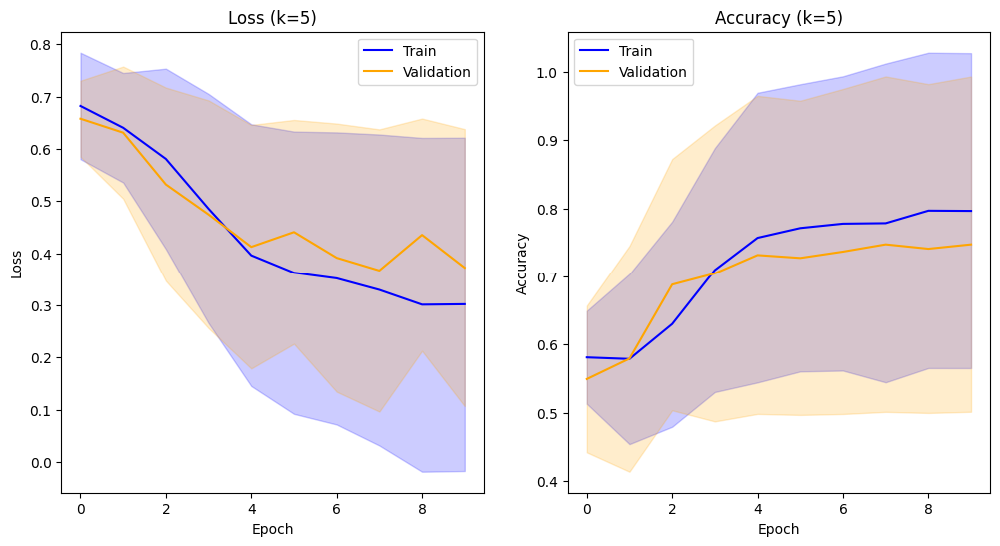

Précision : moyenne=74.714% écart-type=24.590%, k=5


In [15]:
e=[]
k=5
epochs=10
shapeinput=(64, 64, 2) # Format de l'image
run_evaluation(k,epochs)

In [16]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 2)    │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 32258)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     3,225,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,226,158 (12.31 MB)

 Trainable params: 3,226,158 (12.31 MB)

 Non-trainable params: 0 (0.00 B)

None


In [17]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8730 - loss: 0.2945
Epoch 1: val_loss improved from None to 0.05888, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 143s 80ms/step - accuracy: 0.9160 - loss: 0.2133 - val_accuracy: 0.9800 - val_loss: 0.0589
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9538 - loss: 0.1276
Epoch 2: val_loss did not improve from 0.05888
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 138s 78ms/step - accuracy: 0.9570 - loss: 0.1172 - val_accuracy: 0.9717 - val_loss: 0.0805
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.9671 - loss: 0.0913
Epoch 3: val_loss did not improve from 0.05888
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 142s 81ms/step - accuracy: 0.9688 - loss: 0.0863 - val_accuracy: 0.9783 - val_loss: 0.0671
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.9740 - loss: 0.0735
Epoch 4: val_loss did not impro

In [18]:
tf.keras.backend.clear_session()
# Chargement du modèle sauvegardé
model_filename = "CNN2_LV.keras"
model_path = os.path.join(model_dir, model_filename)
model = load_model(model_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


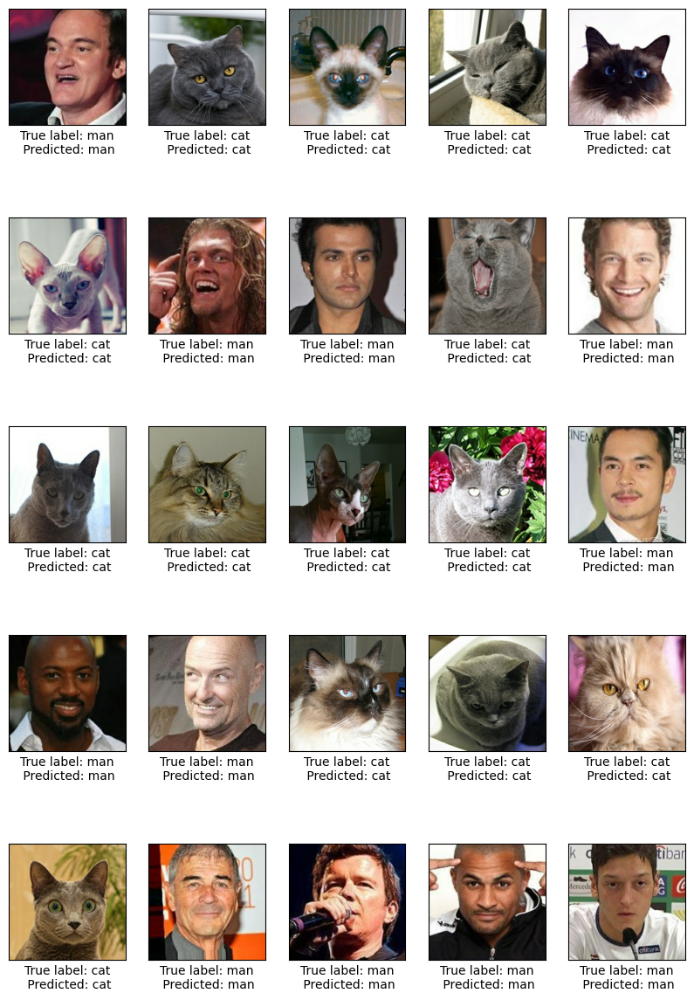

In [19]:
numimage = 110

# Prédiction
y_pred = model.predict(X_test[numimage:numimage+25])  # Prédire 25 image
y_pred_labels = np.argmax(y_pred, axis=1)

# Conversion de y_test
y_true_labels = np.argmax(y_test, axis=1)
plt.figure(figsize=(10,15))
columns = 25
for i in range(columns):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_test[i+numimage],cmap=plt.cm.binary)
    plt.xlabel("True label: " + class_names[y_true_labels[i+numimage]] + "\n Predicted: " + class_names[y_pred_labels[i]])

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


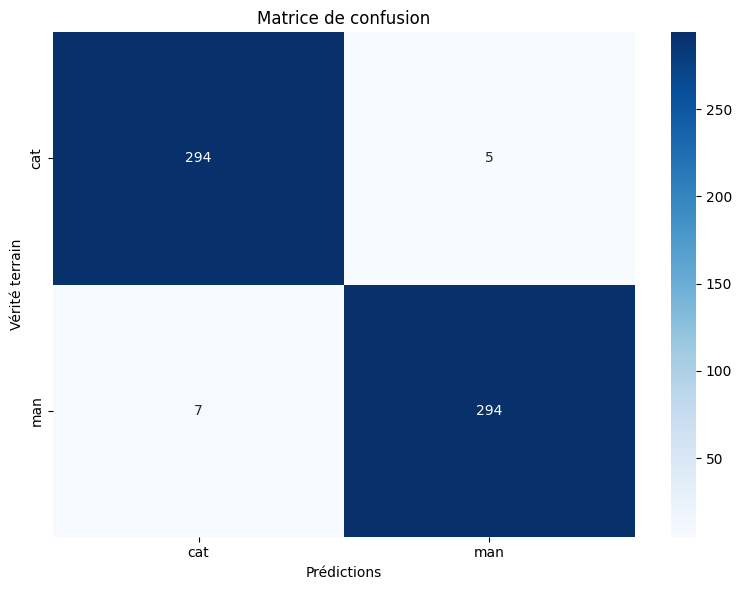

In [20]:
# Chargement du modèle sauvegardé
model_filename = "CNN2_LV.keras"
model_path = os.path.join(model_dir, model_filename)
model = load_model(model_path)

# Prédiction
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)

# Conversion de y_test
y_true_labels = np.argmax(y_test, axis=1)

# Matrice de confusion
conf = confusion_matrix(y_true_labels, y_pred_labels)

# Affichage
plt.figure(figsize=(8, 6))
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title("Matrice de confusion")
plt.xlabel("Prédictions")
plt.ylabel("Vérité terrain")
plt.tight_layout()
plt.show()

## 3 Conv 1 Dense

In [21]:
def define_model(shapeinput=(256, 256, 3)):
   # Définir l'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # conv
    x = Conv2D(2, (3, 3), activation='relu', name="Conv1_Layer")(inputs)
    x = MaxPooling2D((2, 2), name="Pool1_Layer")(x)
    x = Conv2D(3, (5, 5), activation='relu', name="Conv2_Layer")(x)
    x = MaxPooling2D((2, 2), name="Pool2_Layer")(x)
    x = Conv2D(6, (3, 3), activation='relu', name="Conv3_Layer")(x)
    x = MaxPooling2D((2, 2), name="Pool3_Layer")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(1):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def evaluate_model(model, dataX, dataY, folds=5, epochs=10):
    """
    Évalue le modèle avec une validation croisée K-fold.

    Paramètres :
    - model : modèle de réseau de neurones Keras à évaluer.
    - dataX : données d'entrée pour l'entraînement et la validation.
    - dataY : étiquettes de sortie correspondantes.
    - folds : nombre de splits pour la validation croisée.
    - epochs : nombre d'époques pour l'entraînement de chaque split.

    Retourne :
    - scores : liste des scores d'accuracy du modèle pour chaque split.
    - histories : liste des historique d'entraînement pour chaque split.
    """
    scores, histories = [], []  # Initialisation des scores et historiques
    kfold = KFold(n_splits=folds, shuffle=True, random_state=1)

    # Itération sur chaque split généré par le K-fold
    for train_ix, test_ix in kfold.split(dataX):
        # Sélection des données d'entraînement et de test pour le fold
        X_train, y_train = dataX[train_ix], dataY[train_ix]
        X_test, y_test = dataX[test_ix], dataY[test_ix]

        # Réinitialisation du modèle avant chaque itération
        model = define_model()


        # Entraînement du modèle
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # Évaluation du modèle sur les données de test actuelles
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print(f'Précision : {acc * 100:.3f}%')

        # Stockage de l'historique
        scores.append(acc)
        histories.append(history)

    return scores, histories
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv1_Layer (Conv2D)            │ (None, 254, 254, 2)    │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1_Layer (MaxPooling2D)      │ (None, 127, 127, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2_Layer (Conv2D)            │ (None, 123, 123, 3)    │           153 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2_Layer (MaxPooling2D)      │ (None, 61, 61, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3_Layer (Conv2D)            │ (None, 59, 59, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3_Layer (MaxPooling2D)      │ (None, 29, 29, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 5046)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │       504,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 505,279 (1.93 MB)

 Trainable params: 505,279 (1.93 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.7375 - loss: 0.6109 - val_accuracy: 0.9536 - val_loss: 0.2225
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9286 - loss: 0.2472 - val_accuracy: 0.9143 - val_loss: 0.2244
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7071 - loss: 0.5738 - val_accuracy: 0.9036 - val_loss: 0.3609
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9232 - loss: 0.2019 - val_accuracy: 0.9786 - val_loss: 0.0526
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9741 - loss: 0.0758 - val_accuracy: 0.9929 - val_loss: 0.0577
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9955 - loss: 0.0227 - val_accuracy: 0.9929 - val_loss: 0.0295
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9991 - loss: 0.0057 - val_accuracy: 0.9964 - val_loss: 0.0174
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 1.0000 - loss: 0.0017 - val_accuracy: 0.996

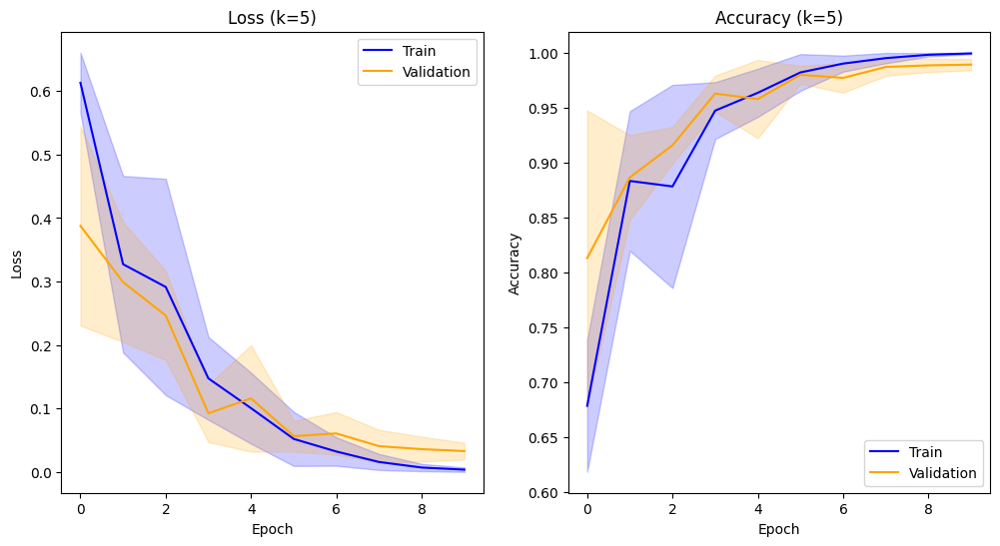

Précision : moyenne=98.929% écart-type=0.505%, k=5


In [22]:
k=5
epochs=10
run_evaluation(k,epochs)

In [23]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv1_Layer (Conv2D)            │ (None, 254, 254, 2)    │            56 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool1_Layer (MaxPooling2D)      │ (None, 127, 127, 2)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2_Layer (Conv2D)            │ (None, 123, 123, 3)    │           153 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool2_Layer (MaxPooling2D)      │ (None, 61, 61, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv3_Layer (Conv2D)            │ (None, 59, 59, 6)      │           168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Pool3_Layer (MaxPooling2D)      │ (None, 29, 29, 6)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 5046)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │       504,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 505,279 (1.93 MB)

 Trainable params: 505,279 (1.93 MB)

 Non-trainable params: 0 (0.00 B)

None


In [24]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=epochs, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8663 - loss: 0.2884
Epoch 1: val_loss improved from None to 0.12561, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 149s 84ms/step - accuracy: 0.9232 - loss: 0.1915 - val_accuracy: 0.9500 - val_loss: 0.1256
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9624 - loss: 0.1055
Epoch 2: val_loss improved from 0.12561 to 0.06759, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 151s 86ms/step - accuracy: 0.9670 - loss: 0.0913 - val_accuracy: 0.9817 - val_loss: 0.0676
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9792 - loss: 0.0582
Epoch 3: val_loss did not improve from 0.06759
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 152s 87ms/step - accuracy: 0.9810 - loss: 0.0529 - val_accuracy: 0.9867 - val_loss: 0.0715
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.98

In [25]:
tf.keras.backend.clear_session()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


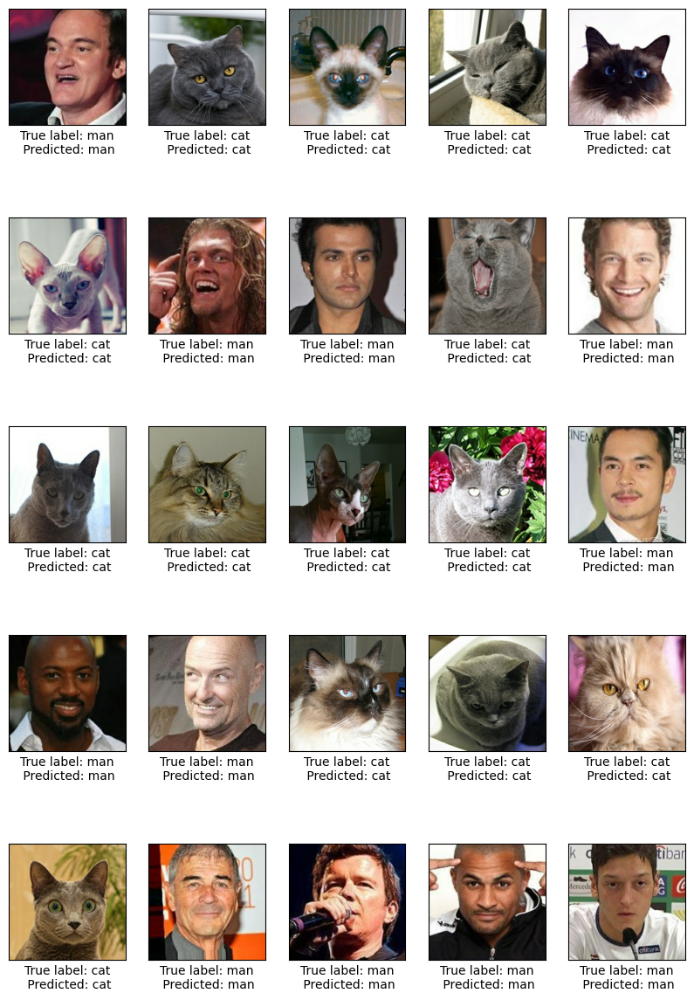

In [26]:
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


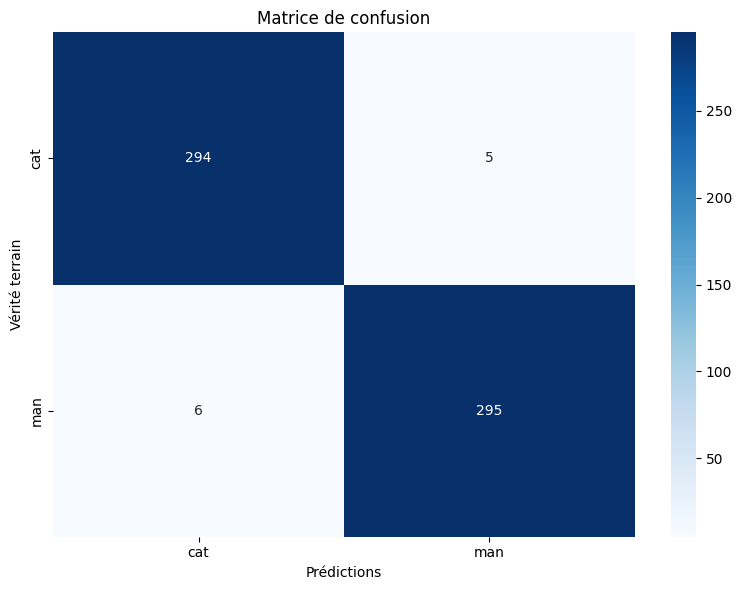

In [30]:
# Chargement du modèle sauvegardé
model_filename = "CNN2_LV.keras"
model_path = os.path.join(model_dir, model_filename)
model = load_model(model_path)

# Prédiction
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)

# Conversion de y_test
y_true_labels = np.argmax(y_test, axis=1)

# Matrice de confusion
conf = confusion_matrix(y_true_labels, y_pred_labels)

# Affichage
plt.figure(figsize=(8, 6))
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title("Matrice de confusion")
plt.xlabel("Prédictions")
plt.ylabel("Vérité terrain")
plt.tight_layout()
plt.show()

## 6 Conv 1 Dense

In [32]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(5):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(1):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def evaluate_model(model, dataX, dataY, folds=5, epochs=10):
    """
    Évalue le modèle avec une validation croisée K-fold.

    Paramètres :
    - model : modèle de réseau de neurones Keras à évaluer.
    - dataX : données d'entrée pour l'entraînement et la validation.
    - dataY : étiquettes de sortie correspondantes.
    - folds : nombre de splits pour la validation croisée.
    - epochs : nombre d'époques pour l'entraînement de chaque split.

    Retourne :
    - scores : liste des scores d'accuracy du modèle pour chaque split.
    - histories : liste des historique d'entraînement pour chaque split.
    """
    scores, histories = [], []  # Initialisation des scores et historiques
    kfold = KFold(n_splits=folds, shuffle=True, random_state=1)

    # Itération sur chaque split généré par le K-fold
    for train_ix, test_ix in kfold.split(dataX):
        # Sélection des données d'entraînement et de test pour le fold
        X_train, y_train = dataX[train_ix], dataY[train_ix]
        X_test, y_test = dataX[test_ix], dataY[test_ix]

        # Réinitialisation du modèle avant chaque itération
        model = define_model()


        # Entraînement du modèle
        history = model.fit(X_train, y_train, epochs=epochs, batch_size=32,
                            validation_data=(X_test, y_test), verbose=1)

        # Évaluation du modèle sur les données de test actuelles
        loss, acc = model.evaluate(X_test, y_test, verbose=0)
        print(f'Précision : {acc * 100:.3f}%')

        # Stockage de l'historique
        scores.append(acc)
        histories.append(history)

    return scores, histories

def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 60,238 (235.30 KB)

 Trainable params: 60,238 (235.30 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 294ms/step - accuracy: 0.5562 - loss: 0.6858 - val_accuracy: 0.5321 - val_loss: 0.6685
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 269ms/step - accuracy: 0.7348 - loss: 0.5764 - val_accuracy: 0.5786 - val_loss: 0.7486
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 10s 278ms/step - accuracy: 0.7152 - loss: 0.5659 - val_accuracy: 0.8536 - val_loss: 0.3657
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - accuracy: 0.8482 - loss: 0.3664 - val_accuracy: 0.9143 - val_loss: 0.3533
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.9080 - loss: 0.2406 - val_accuracy: 0.9357 - val_loss: 0.2126
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - accuracy: 0.9366 - loss: 0.1804 - val_accuracy: 0.9000 - val_loss: 0.2976
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - accuracy: 0.9357 - loss: 0.1791 - val_accuracy: 0.9250 - val_loss: 0.2183
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - accuracy: 0.9339 - loss: 0.1894 - val_accur

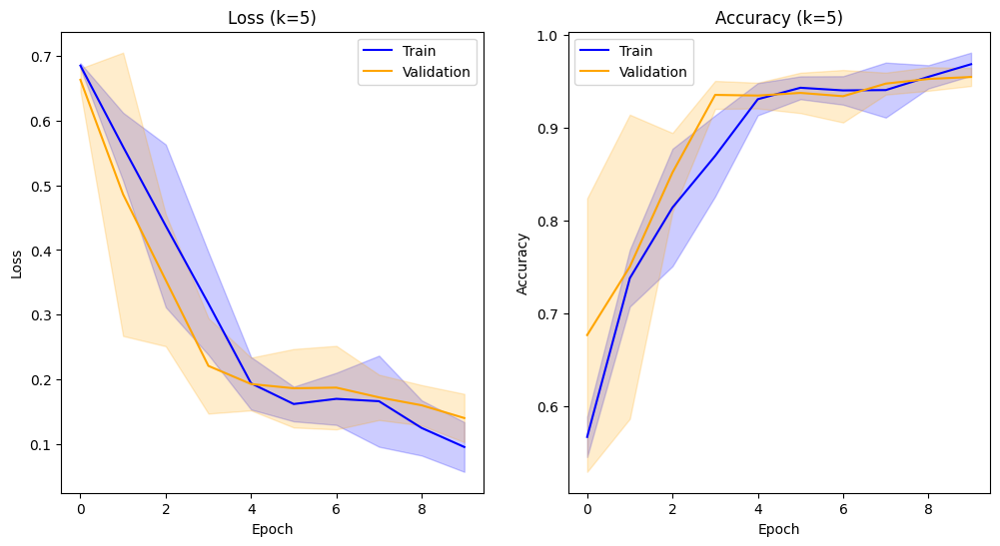

Précision : moyenne=95.429% écart-type=0.969%, k=5


In [33]:
k=5
epochs=10
run_evaluation(k,epochs)

In [34]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 60,238 (235.30 KB)

 Trainable params: 60,238 (235.30 KB)

 Non-trainable params: 0 (0.00 B)

None


In [35]:
model = define_model()
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.8571 - loss: 0.3028
Epoch 1: val_loss improved from None to 0.04255, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 897s 508ms/step - accuracy: 0.9299 - loss: 0.1680 - val_accuracy: 0.9867 - val_loss: 0.0425
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.9821 - loss: 0.0488
Epoch 2: val_loss did not improve from 0.04255
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 911s 517ms/step - accuracy: 0.9861 - loss: 0.0386 - val_accuracy: 0.9833 - val_loss: 0.0610
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.9927 - loss: 0.0216
Epoch 3: val_loss did not improve from 0.04255
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 913s 519ms/step - accuracy: 0.9937 - loss: 0.0186 - val_accuracy: 0.9867 - val_loss: 0.0470
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 522ms/step - accuracy: 0.9958 - loss: 0.0121
Epoch 4: val_loss improv

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


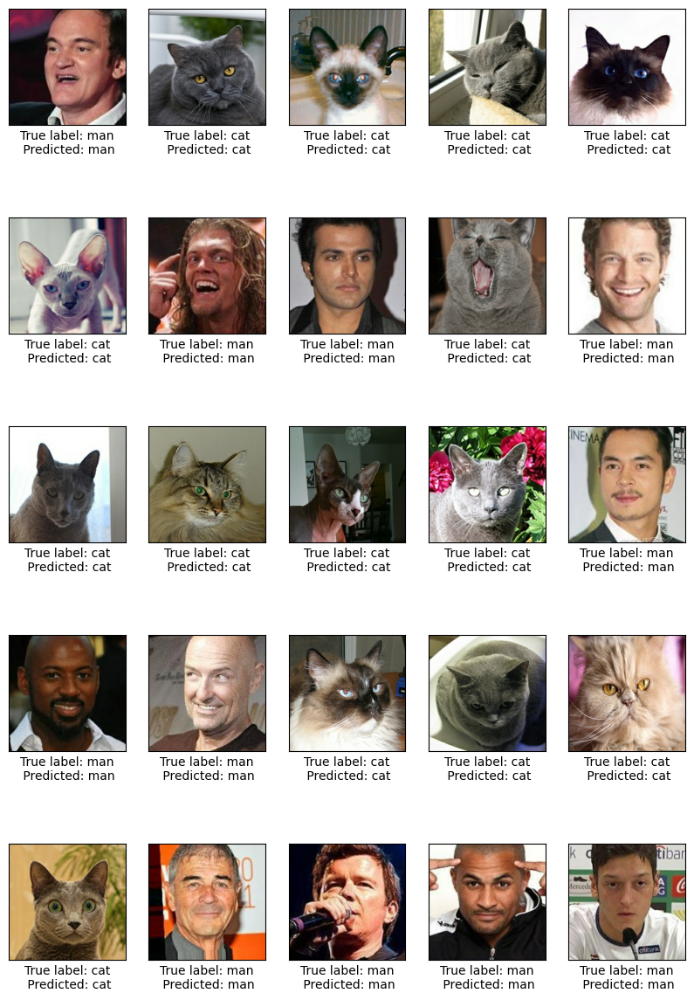

In [36]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step


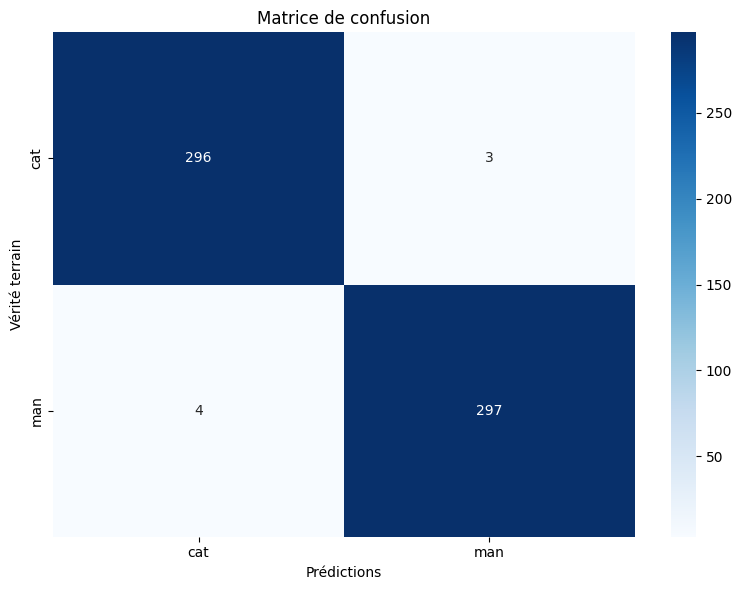

In [37]:
matrice()

## 1 Conv 3 Dense

In [38]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    for i in range(1):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+1}")(inputs)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+1}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(3):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,634,198 (196.97 MB)

 Trainable params: 51,634,198 (196.97 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 13s 368ms/step - accuracy: 0.5491 - loss: 0.7248 - val_accuracy: 0.5857 - val_loss: 0.6223
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 344ms/step - accuracy: 0.8304 - loss: 0.3860 - val_accuracy: 0.9214 - val_loss: 0.2515
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 337ms/step - accuracy: 0.9214 - loss: 0.2198 - val_accuracy: 0.9429 - val_loss: 0.1917
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 344ms/step - accuracy: 0.9384 - loss: 0.1602 - val_accuracy: 0.9393 - val_loss: 0.2063
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 340ms/step - accuracy: 0.8929 - loss: 0.2892 - val_accuracy: 0.9286 - val_loss: 0.2101
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 344ms/step - accuracy: 0.9062 - loss: 0.2562 - val_accuracy: 0.8286 - val_loss: 0.4689
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 346ms/step - accuracy: 0.9295 - loss: 0.1795 - val_accuracy: 0.9607 - val_loss: 0.1231
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 340ms/step - accuracy: 0.9679 - loss: 0.0895 - val

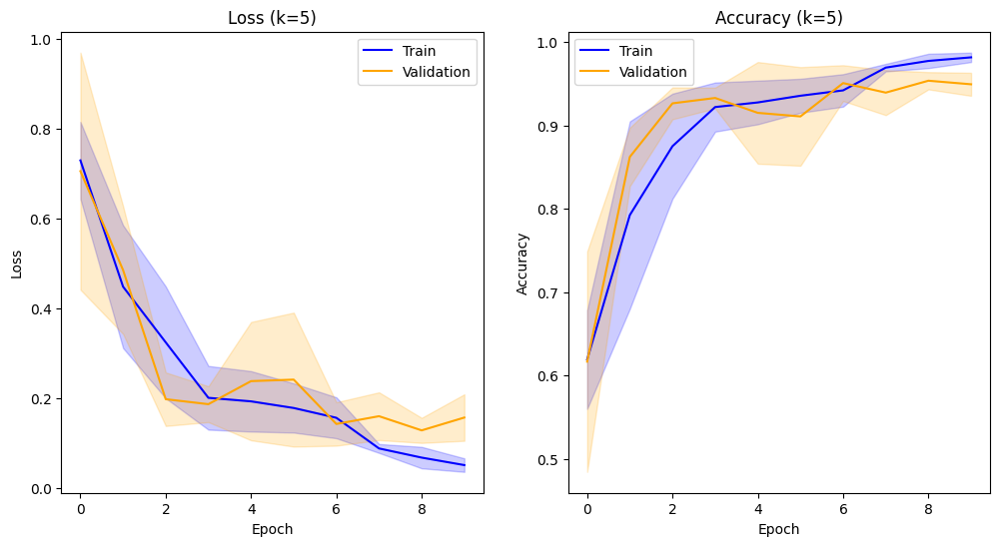

Précision : moyenne=94.929% écart-type=1.381%, k=5


In [39]:
k=5
epochs=10
run_evaluation(k,epochs)

In [40]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,634,198 (196.97 MB)

 Trainable params: 51,634,198 (196.97 MB)

 Non-trainable params: 0 (0.00 B)

None


In [41]:
model = define_model()
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=epochs, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.8795 - loss: 0.2768
Epoch 1: val_loss improved from None to 0.07644, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 919s 522ms/step - accuracy: 0.9300 - loss: 0.1748 - val_accuracy: 0.9750 - val_loss: 0.0764
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.9714 - loss: 0.0794
Epoch 2: val_loss improved from 0.07644 to 0.06753, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 919s 522ms/step - accuracy: 0.9741 - loss: 0.0716 - val_accuracy: 0.9767 - val_loss: 0.0675
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 553ms/step - accuracy: 0.9815 - loss: 0.0501
Epoch 3: val_loss did not improve from 0.06753
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 974s 554ms/step - accuracy: 0.9829 - loss: 0.0471 - val_accuracy: 0.9783 - val_loss: 0.0904
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accurac

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


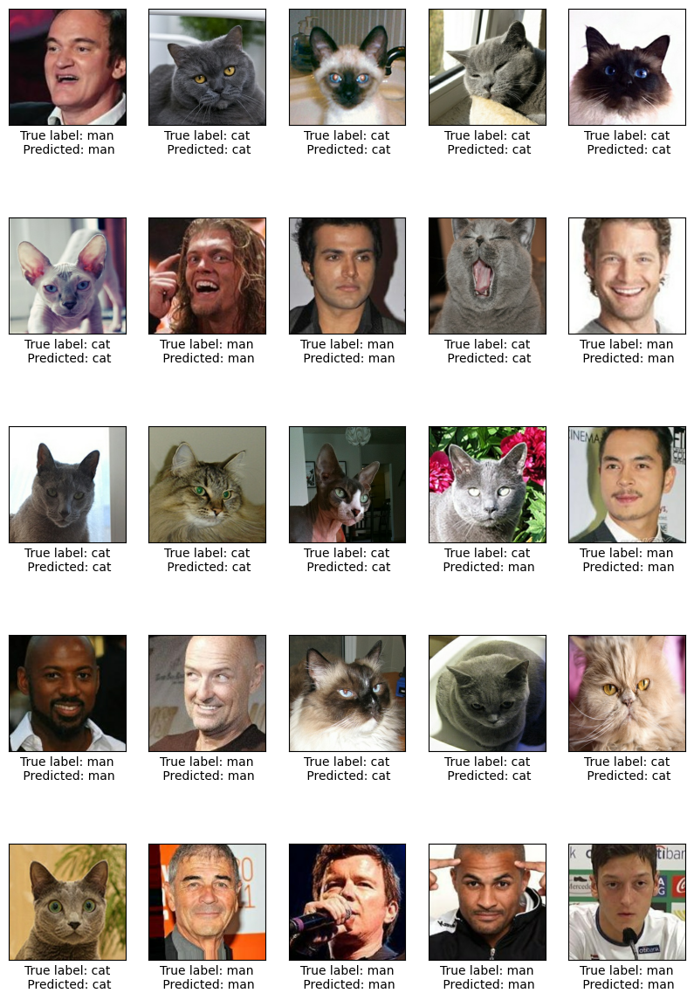

In [42]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step


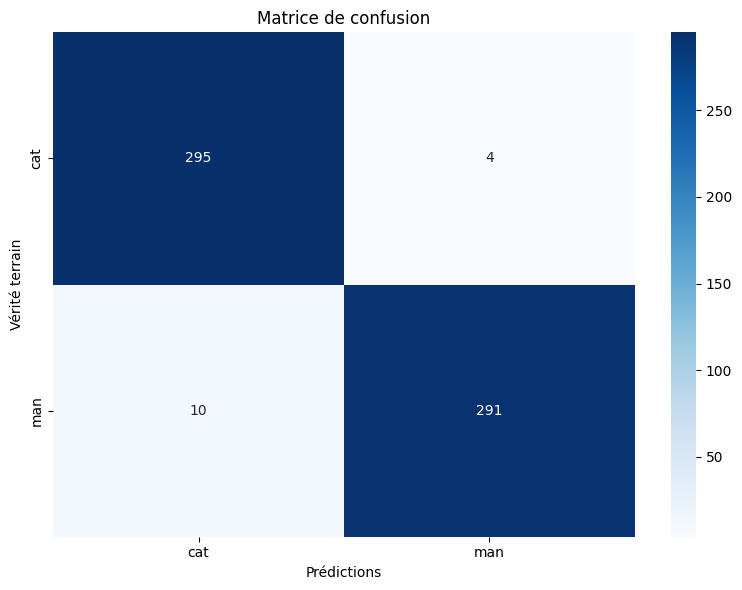

In [43]:
matrice()

## 3 Conv 3 Dense

In [44]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(2):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)


    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(3):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,919,894 (11.14 MB)

 Trainable params: 2,919,894 (11.14 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 277ms/step - accuracy: 0.6223 - loss: 0.6669 - val_accuracy: 0.7536 - val_loss: 0.5475
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 263ms/step - accuracy: 0.8223 - loss: 0.4352 - val_accuracy: 0.8214 - val_loss: 0.5019
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 262ms/step - accuracy: 0.8616 - loss: 0.3464 - val_accuracy: 0.9036 - val_loss: 0.2525
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 255ms/step - accuracy: 0.9473 - loss: 0.1494 - val_accuracy: 0.9429 - val_loss: 0.1867
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - accuracy: 0.9518 - loss: 0.1311 - val_accuracy: 0.9571 - val_loss: 0.1208
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - accuracy: 0.9679 - loss: 0.0968 - val_accuracy: 0.8679 - val_loss: 0.5154
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 258ms/step - accuracy: 0.9321 - loss: 0.1762 - val_accuracy: 0.9536 - val_loss: 0.1377
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - accuracy: 0.9679 - loss: 0.0815 - val_accura

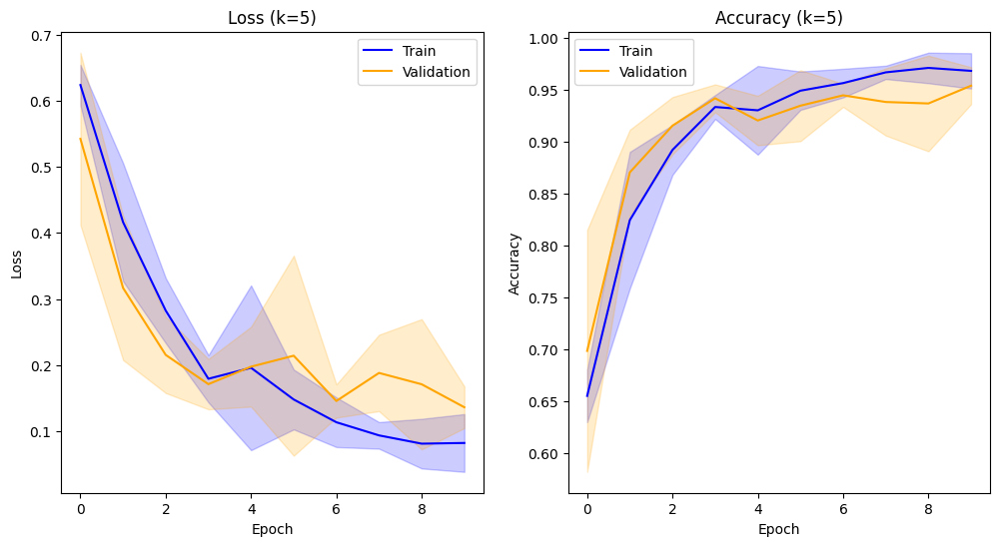

Précision : moyenne=95.429% écart-type=1.784%, k=5


In [45]:
k=5
epochs=10
run_evaluation(k,epochs)

In [46]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,919,894 (11.14 MB)

 Trainable params: 2,919,894 (11.14 MB)

 Non-trainable params: 0 (0.00 B)

None


In [47]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=epochs, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - accuracy: 0.8711 - loss: 0.2776
Epoch 1: val_loss improved from None to 0.10055, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 910s 516ms/step - accuracy: 0.9325 - loss: 0.1643 - val_accuracy: 0.9567 - val_loss: 0.1005
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.9782 - loss: 0.0605
Epoch 2: val_loss improved from 0.10055 to 0.07151, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 912s 518ms/step - accuracy: 0.9823 - loss: 0.0500 - val_accuracy: 0.9767 - val_loss: 0.0715
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - accuracy: 0.9901 - loss: 0.0276
Epoch 3: val_loss improved from 0.07151 to 0.06011, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 911s 517ms/step - accuracy: 0.9913 - loss: 0.0249 - val_accuracy: 0.9800 - val_loss: 0.0601
Epoch 4/5
1760/

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


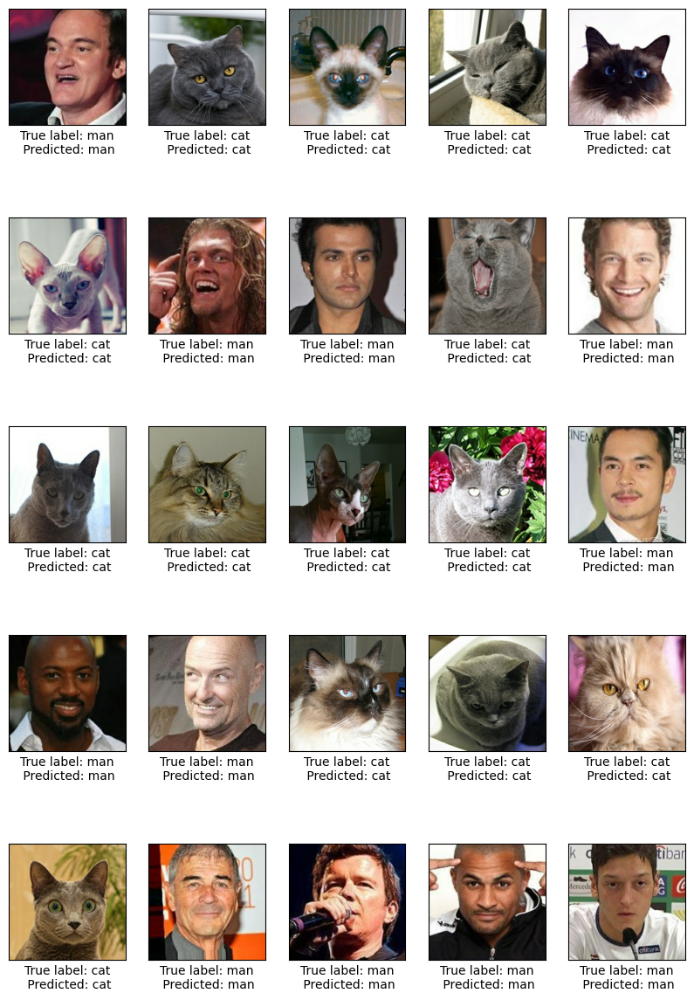

In [48]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step


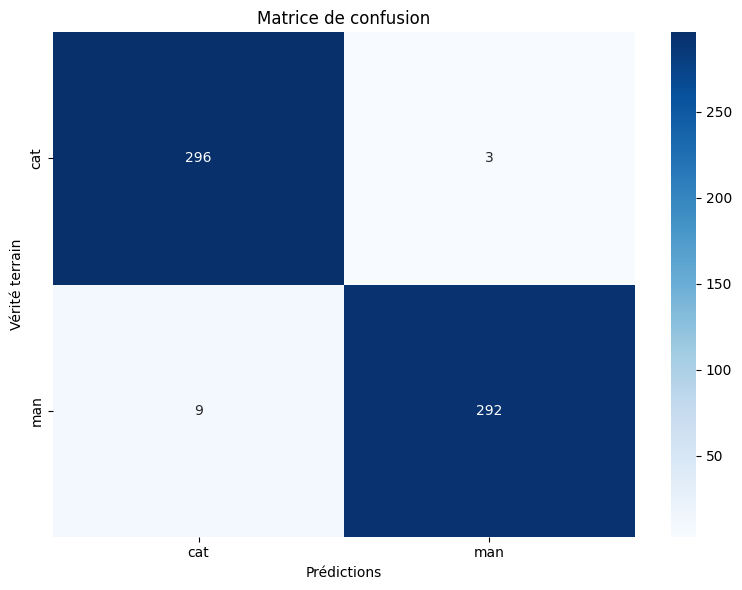

In [49]:
matrice()

## 6 Conv 3 Dense

In [50]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(5):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(3):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,438 (314.21 KB)

 Trainable params: 80,438 (314.21 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 10s 271ms/step - accuracy: 0.6205 - loss: 0.6818 - val_accuracy: 0.7893 - val_loss: 0.6436
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - accuracy: 0.6536 - loss: 0.6530 - val_accuracy: 0.7357 - val_loss: 0.5964
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 251ms/step - accuracy: 0.8384 - loss: 0.4280 - val_accuracy: 0.8964 - val_loss: 0.2895
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - accuracy: 0.9134 - loss: 0.2372 - val_accuracy: 0.8679 - val_loss: 0.3432
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 256ms/step - accuracy: 0.8902 - loss: 0.2620 - val_accuracy: 0.9250 - val_loss: 0.2285
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - accuracy: 0.9295 - loss: 0.1961 - val_accuracy: 0.9321 - val_loss: 0.2027
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - accuracy: 0.9411 - loss: 0.1561 - val_accuracy: 0.9321 - val_loss: 0.2001
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - accuracy: 0.9554 - loss: 0.1247 - val_accura

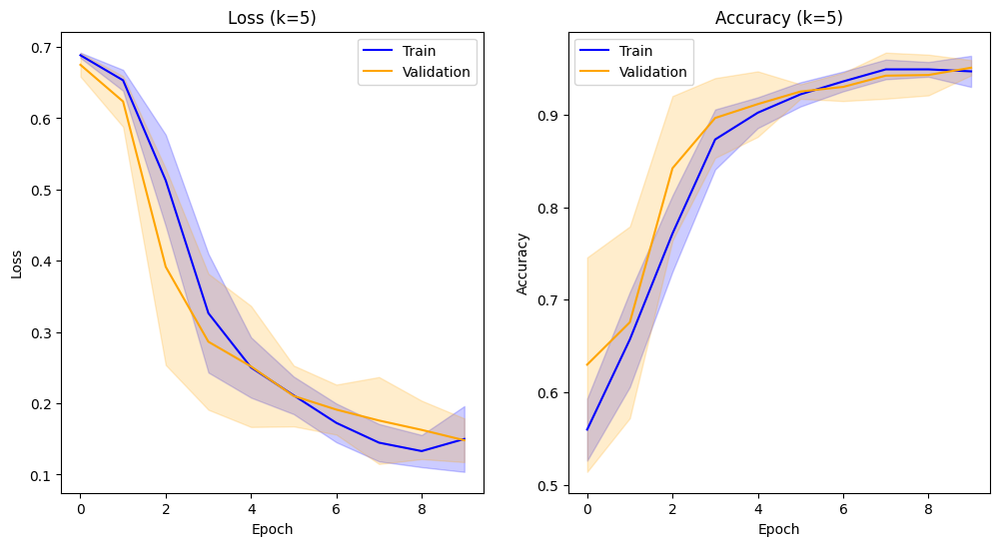

Précision : moyenne=95.071% écart-type=0.827%, k=5


In [51]:
k=5
epochs=10
run_evaluation(k,epochs)

In [52]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,438 (314.21 KB)

 Trainable params: 80,438 (314.21 KB)

 Non-trainable params: 0 (0.00 B)

None


In [53]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 503ms/step - accuracy: 0.8631 - loss: 0.2873
Epoch 1: val_loss improved from None to 0.03252, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 889s 504ms/step - accuracy: 0.9345 - loss: 0.1561 - val_accuracy: 0.9867 - val_loss: 0.0325
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.9860 - loss: 0.0400
Epoch 2: val_loss did not improve from 0.03252
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 894s 508ms/step - accuracy: 0.9890 - loss: 0.0312 - val_accuracy: 0.9933 - val_loss: 0.0370
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.9931 - loss: 0.0190
Epoch 3: val_loss improved from 0.03252 to 0.02588, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 911s 518ms/step - accuracy: 0.9941 - loss: 0.0158 - val_accuracy: 0.9967 - val_loss: 0.0259
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accurac

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


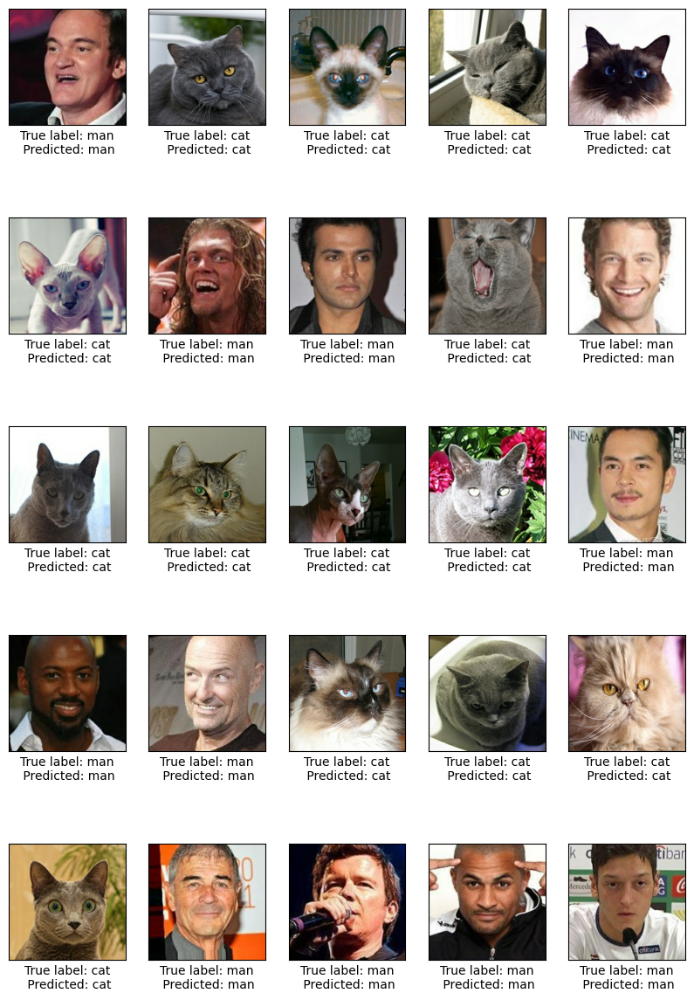

In [54]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step


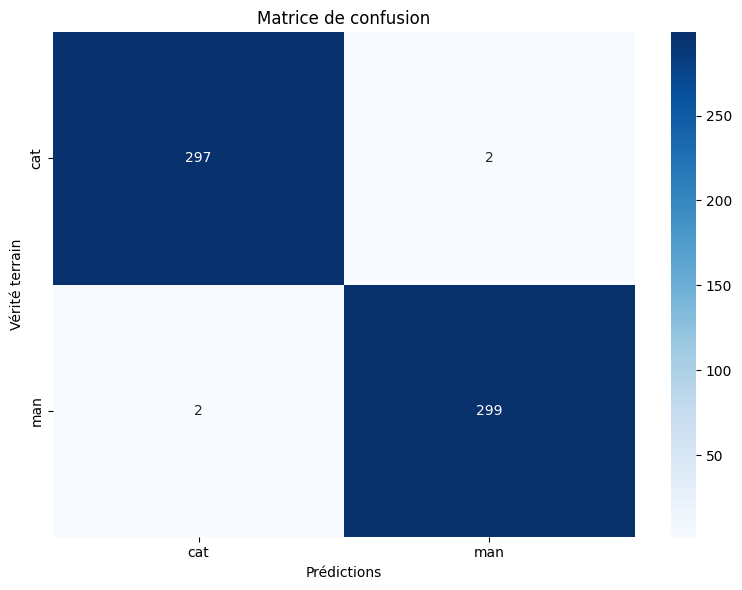

In [55]:
matrice()

## 1 Conv 6 Dense

In [56]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    for i in range(1):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+1}")(inputs)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+1}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(6):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,664,498 (197.08 MB)

 Trainable params: 51,664,498 (197.08 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 14s 382ms/step - accuracy: 0.6527 - loss: 0.6295 - val_accuracy: 0.8714 - val_loss: 0.5686
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 356ms/step - accuracy: 0.7893 - loss: 0.4843 - val_accuracy: 0.9214 - val_loss: 0.2394
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 13s 360ms/step - accuracy: 0.9250 - loss: 0.2115 - val_accuracy: 0.8964 - val_loss: 0.4259
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 353ms/step - accuracy: 0.9241 - loss: 0.2037 - val_accuracy: 0.8893 - val_loss: 0.2509
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 351ms/step - accuracy: 0.9223 - loss: 0.1823 - val_accuracy: 0.9143 - val_loss: 0.2020
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 352ms/step - accuracy: 0.9625 - loss: 0.1127 - val_accuracy: 0.9393 - val_loss: 0.1771
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 347ms/step - accuracy: 0.9812 - loss: 0.0633 - val_accuracy: 0.9571 - val_loss: 0.1188
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 12s 349ms/step - accuracy: 0.9812 - loss: 0.0439 - val

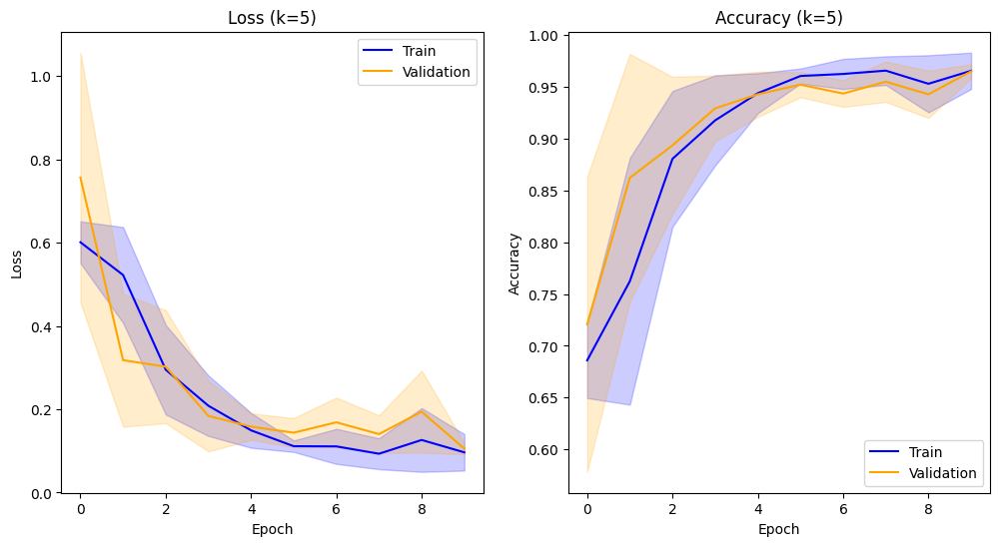

Précision : moyenne=96.500% écart-type=0.693%, k=5


In [57]:
k=5
epochs=10
run_evaluation(k,epochs)

In [58]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 516128)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │    51,612,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,664,498 (197.08 MB)

 Trainable params: 51,664,498 (197.08 MB)

 Non-trainable params: 0 (0.00 B)

None


In [59]:
model = define_model()
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 535ms/step - accuracy: 0.8685 - loss: 0.2842
Epoch 1: val_loss improved from None to 0.07015, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 949s 538ms/step - accuracy: 0.9265 - loss: 0.1761 - val_accuracy: 0.9733 - val_loss: 0.0702
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.9743 - loss: 0.0696
Epoch 2: val_loss did not improve from 0.07015
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 953s 541ms/step - accuracy: 0.9783 - loss: 0.0599 - val_accuracy: 0.9650 - val_loss: 0.0854
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accuracy: 0.9847 - loss: 0.0430
Epoch 3: val_loss did not improve from 0.07015
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 966s 549ms/step - accuracy: 0.9867 - loss: 0.0379 - val_accuracy: 0.9750 - val_loss: 0.0937
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.9906 - loss: 0.0263
Epoch 4: val_loss did no

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step


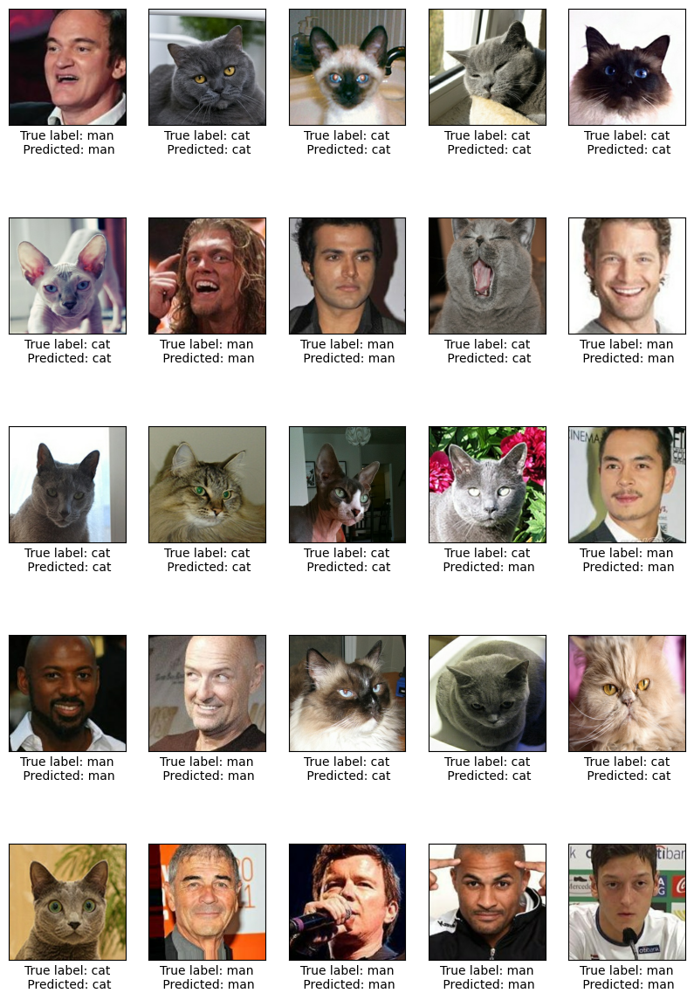

In [60]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step


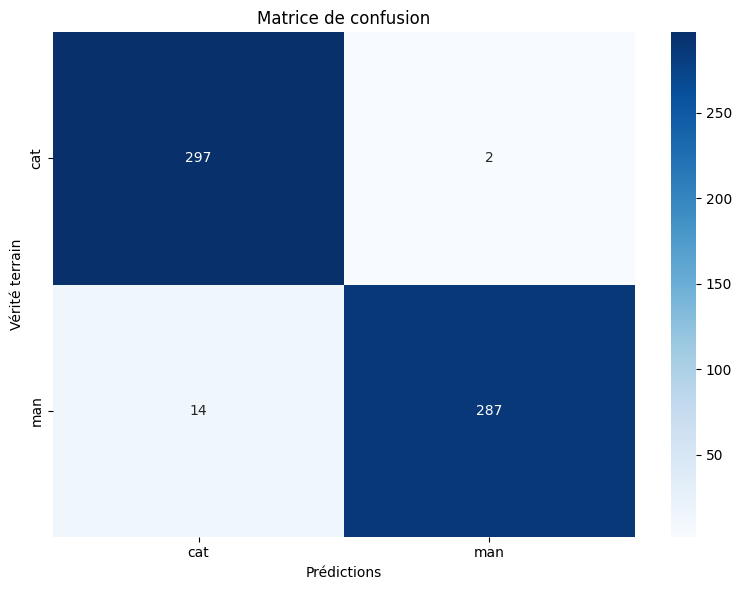

In [61]:
matrice()

## 3 Conv 6 Dense

In [62]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(2):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(6):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,950,194 (11.25 MB)

 Trainable params: 2,950,194 (11.25 MB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 281ms/step - accuracy: 0.6313 - loss: 0.6832 - val_accuracy: 0.8321 - val_loss: 0.6387
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 265ms/step - accuracy: 0.7991 - loss: 0.5146 - val_accuracy: 0.5286 - val_loss: 0.7180
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 261ms/step - accuracy: 0.6804 - loss: 0.6370 - val_accuracy: 0.7929 - val_loss: 0.6303
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 266ms/step - accuracy: 0.8634 - loss: 0.4294 - val_accuracy: 0.7893 - val_loss: 0.4810
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.9009 - loss: 0.2733 - val_accuracy: 0.9286 - val_loss: 0.1869
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - accuracy: 0.9259 - loss: 0.2006 - val_accuracy: 0.9393 - val_loss: 0.1771
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - accuracy: 0.9348 - loss: 0.1923 - val_accuracy: 0.9250 - val_loss: 0.1887
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 260ms/step - accuracy: 0.9455 - loss: 0.1528 - val_accura

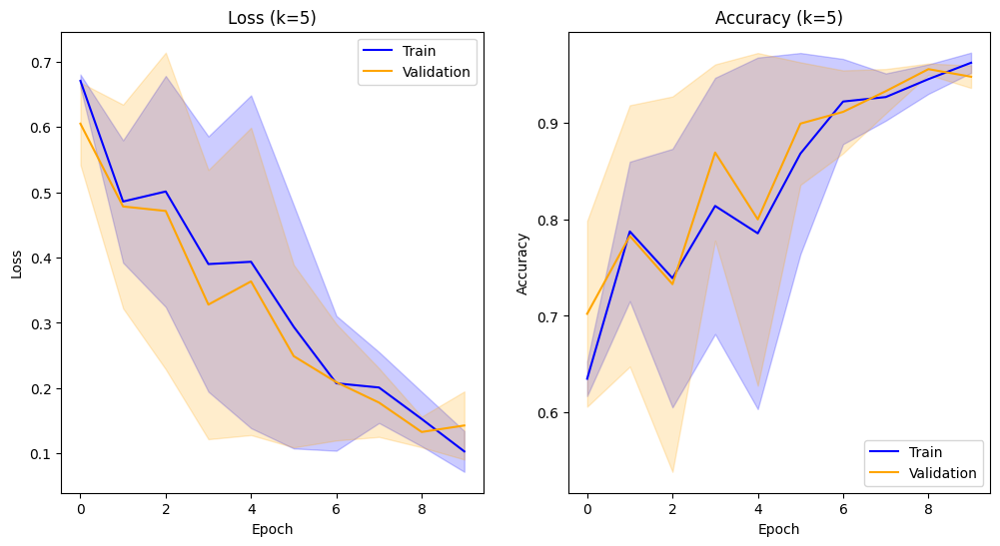

Précision : moyenne=94.786% écart-type=1.165%, k=5


In [63]:
k=5
epochs=10
run_evaluation(k,epochs)

In [64]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │     2,880,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,950,194 (11.25 MB)

 Trainable params: 2,950,194 (11.25 MB)

 Non-trainable params: 0 (0.00 B)

None


In [65]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.8667 - loss: 0.2787
Epoch 1: val_loss improved from None to 0.07150, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 901s 511ms/step - accuracy: 0.9340 - loss: 0.1590 - val_accuracy: 0.9767 - val_loss: 0.0715
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 507ms/step - accuracy: 0.9832 - loss: 0.0482
Epoch 2: val_loss improved from 0.07150 to 0.06083, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 896s 509ms/step - accuracy: 0.9861 - loss: 0.0400 - val_accuracy: 0.9800 - val_loss: 0.0608
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.9920 - loss: 0.0227
Epoch 3: val_loss did not improve from 0.06083
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 930s 528ms/step - accuracy: 0.9934 - loss: 0.0190 - val_accuracy: 0.9833 - val_loss: 0.0855
Epoch 4/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accurac

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step


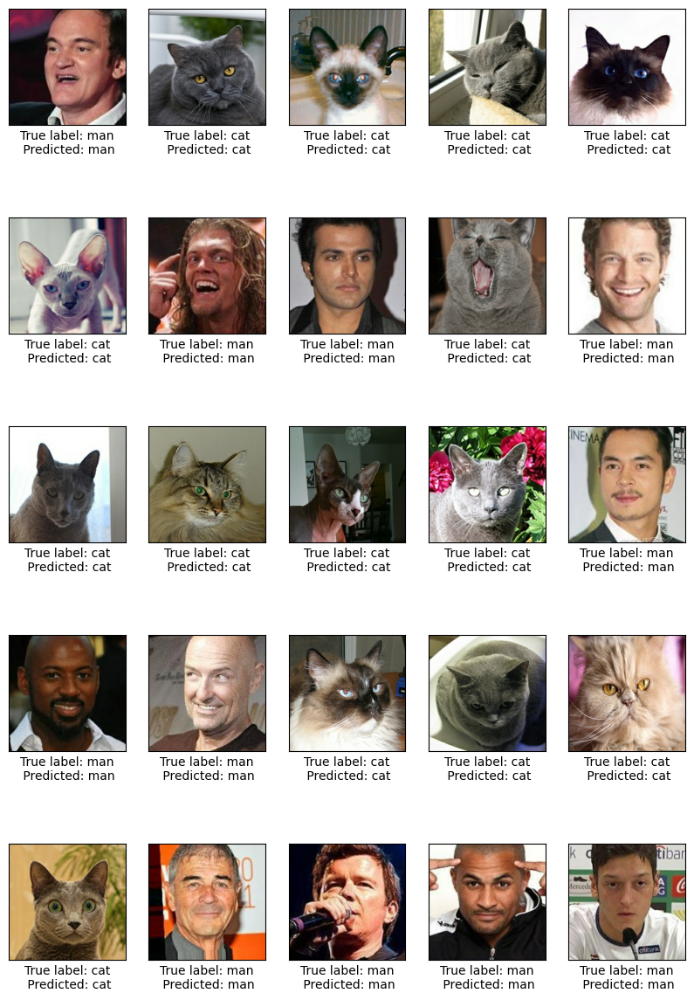

In [66]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step


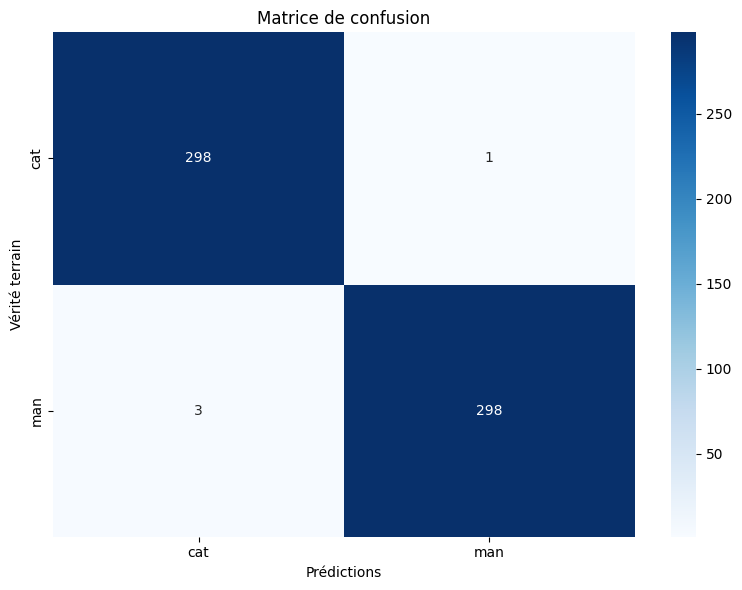

In [67]:
matrice()

## 6 Conv 6 Denses

In [68]:
def define_model(shapeinput=(256, 256, 3)):
    # Couche d'entrée
    inputs = Input(shape=shapeinput, name="Input_Layer")

    # Couche convolutionnelle avec pooling
    x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name="Conv2D_1")(inputs)
    x = MaxPooling2D(pool_size=(2, 2), name="MaxPooling2D_1")(x)
    # Couche convolutionnelle avec pooling
    for i in range(5):
        x = Conv2D(filters=32, kernel_size=(3, 3), activation='relu', name=f"Conv2D_{i+2}")(x)
        x = MaxPooling2D(pool_size=(2, 2), name=f"MaxPooling2D_{i+2}")(x)

    # Flatten pour préparer les données pour la partie dense
    x = Flatten(name="Flatten")(x)

    # Couches denses pour la classification
    for i in range(6):
        x = Dense(100, activation='relu', name=f"Dense_{i+1}")(x)
    outputs = Dense(2, activation='softmax', name="Output")(x)
    model = Model(inputs=inputs, outputs=outputs, name="Baseline_CNN")

    # Compilation du modèle
    opt = SGD(learning_rate=0.01, momentum=0.9)
    model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])

    return model
def run_evaluation(folds, epochs):
    """
    Fonction d'évaluation

    Cette fonction effectue les étapes suivantes :
    1. Chargement du jeu de données Fashion MNIST.
    2. Prétraitement des données : nettoyage et normalisation.
    3. Initialisation du modèle de base et affichage de sa structure.
    4. Évaluation du modèle avec validation croisée (K-fold).
    5. Affichage des courbes de performance et des statistiques de précision.

    Paramètres :
    - folds (int) : Nombre de splits pour la validation croisée (K-fold).
    - epochs (int) : Nombre d'époques d'entraînement pour chaque pli du K-fold.

    Retourne :
    - None
    """

    # Chargement du jeu de données d'entraînement et de test
    X_train, y_train, X_test, y_test, class_names = load_dataset()

    # Prétraitement des données : nettoyage et normalisation
    X_train, X_test = clean_data(X_train, X_test)

    # Initialisation du modèle de base
    model = define_model()
    print(model.summary())

    # Évaluation du modèle
    scores, histories = evaluate_model(model, X_train, y_train, folds, epochs)

    # Affichage des courbes de performance
    plot_curves(histories)

    # Affichage des statistiques de précision : moyenne et écart-type
    print(f'Précision : moyenne={mean(scores) * 100:.3f}% écart-type={std(scores) * 100:.3f}%, k={len(scores)}')

Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,738 (432.57 KB)

 Trainable params: 110,738 (432.57 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 11s 276ms/step - accuracy: 0.5143 - loss: 0.6930 - val_accuracy: 0.7643 - val_loss: 0.6904
Epoch 2/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 255ms/step - accuracy: 0.6143 - loss: 0.6870 - val_accuracy: 0.6000 - val_loss: 0.6758
Epoch 3/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 253ms/step - accuracy: 0.6795 - loss: 0.6528 - val_accuracy: 0.6179 - val_loss: 0.6075
Epoch 4/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - accuracy: 0.7437 - loss: 0.5178 - val_accuracy: 0.6571 - val_loss: 0.6423
Epoch 5/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 256ms/step - accuracy: 0.8107 - loss: 0.4564 - val_accuracy: 0.8071 - val_loss: 0.5987
Epoch 6/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 252ms/step - accuracy: 0.8643 - loss: 0.4237 - val_accuracy: 0.9000 - val_loss: 0.2653
Epoch 7/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 256ms/step - accuracy: 0.9143 - loss: 0.2253 - val_accuracy: 0.9000 - val_loss: 0.2860
Epoch 8/10
35/35 ━━━━━━━━━━━━━━━━━━━━ 9s 254ms/step - accuracy: 0.9232 - loss: 0.2044 - val_accura

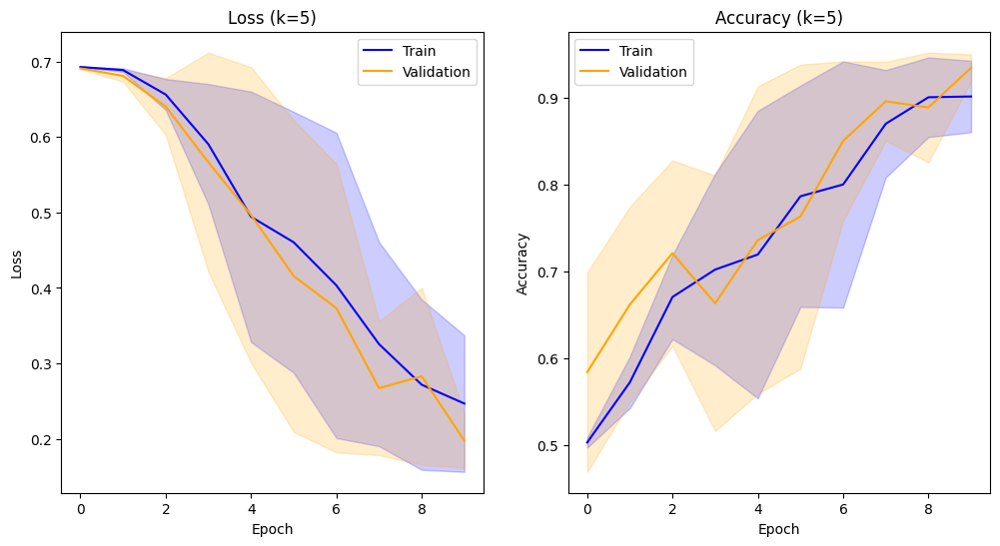

Précision : moyenne=93.500% écart-type=1.555%, k=5


In [69]:
k=5
epochs=10
run_evaluation(k,epochs)

In [70]:
# Paramètres d'entraînement
epochs = 5
batch_size = 64
model_filename = "CNN2_LV.keras"

# Définition du répertoire cible
model_dir = "./data/models"

# Création du répertoire s'il n'existe pas
os.makedirs(model_dir, exist_ok=True)


model_path = os.path.join(model_dir, model_filename)
# Chemin des images
data_dir = "./data/dataset/humanface_cat_without_caption_1000/images"
# Chargement et normalisation du jeu de données
X_train, y_train, X_test, y_test, class_names = load_dataset()
X_train, X_test = clean_data(X_train, X_test)

# Définition du modèle
model = define_model()
print(model.summary())

AUTOTUNE = tf.data.AUTOTUNE

augment = tf.keras.Sequential(
    [
        tf.keras.layers.RandomTranslation(0.2, 0.2),
        tf.keras.layers.RandomFlip("horizontal"),
    ],
    name="augment",
)

train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), reshuffle_each_iteration=True)
train_ds = train_ds.batch(batch_size, drop_remainder=False)
train_ds = train_ds.map(lambda x, y: (augment(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds = train_ds.repeat().prefetch(AUTOTUNE)  # <-- repeat()

# Nombre de batchs "normal" pour 1 epoch
base_steps = int(np.ceil(len(X_train) / batch_size))


Found 2000 files belonging to 2 classes.
Using 1400 files for training.
Found 2000 files belonging to 2 classes.
Using 600 files for validation.


Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Input_Layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_1 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_1 (MaxPooling2D)   │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_2 (Conv2D)               │ (None, 125, 125, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_2 (MaxPooling2D)   │ (None, 62, 62, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_3 (Conv2D)               │ (None, 60, 60, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_3 (MaxPooling2D)   │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_4 (Conv2D)               │ (None, 28, 28, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_4 (MaxPooling2D)   │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_5 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_5 (MaxPooling2D)   │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Conv2D_6 (Conv2D)               │ (None, 4, 4, 32)       │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MaxPooling2D_6 (MaxPooling2D)   │ (None, 2, 2, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_1 (Dense)                 │ (None, 100)            │        12,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_2 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_3 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_4 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_5 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense_6 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Output (Dense)                  │ (None, 2)              │           202 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,738 (432.57 KB)

 Trainable params: 110,738 (432.57 KB)

 Non-trainable params: 0 (0.00 B)

None


In [71]:
model = train_cnn_model(model, train_ds,
                          (X_test, y_test), model_path, epochs=5, patience=8, mult_datagen=80)

Image par epoch(avec datagen) : 112640, nb image par batch : 64
Epoch 1/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 504ms/step - accuracy: 0.5415 - loss: 0.6862
Epoch 1: val_loss improved from None to 0.69318, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 890s 505ms/step - accuracy: 0.5142 - loss: 0.6903 - val_accuracy: 0.4983 - val_loss: 0.6932
Epoch 2/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.5336 - loss: 0.6653
Epoch 2: val_loss improved from 0.69318 to 0.11040, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 918s 522ms/step - accuracy: 0.6596 - loss: 0.5375 - val_accuracy: 0.9600 - val_loss: 0.1104
Epoch 3/5
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.9573 - loss: 0.1149
Epoch 3: val_loss improved from 0.11040 to 0.06281, saving model to ./data/models\CNN2_LV.keras
1760/1760 ━━━━━━━━━━━━━━━━━━━━ 912s 518ms/step - accuracy: 0.9694 - loss: 0.0841 - val_accuracy: 0.9833 - val_loss: 0.0628
Epoch 4/5
1760/

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step


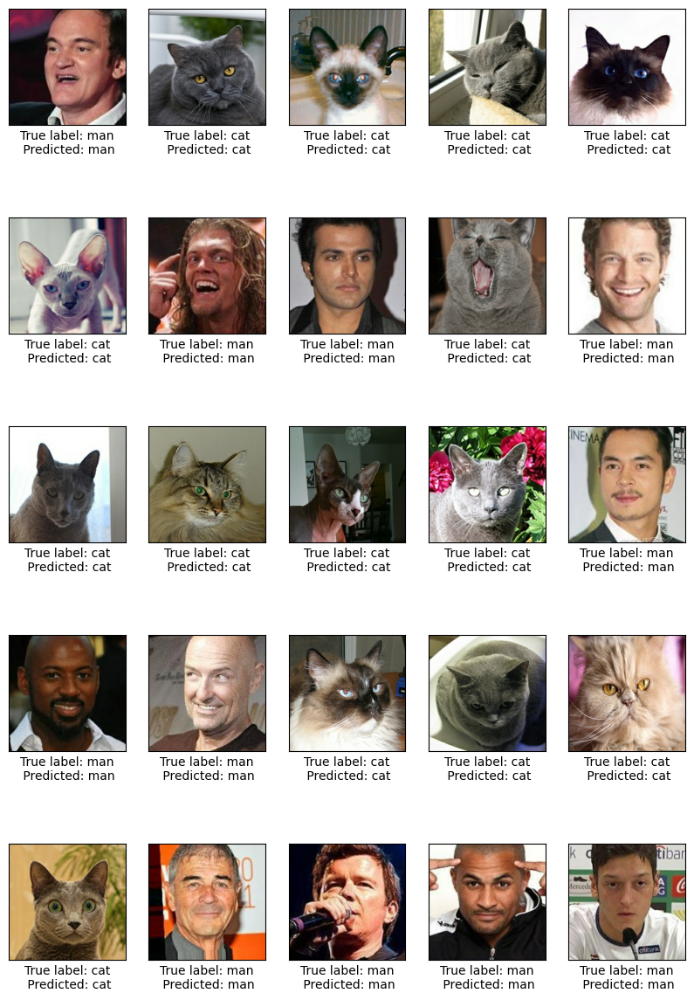

In [72]:
tf.keras.backend.clear_session()
prediction()

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step


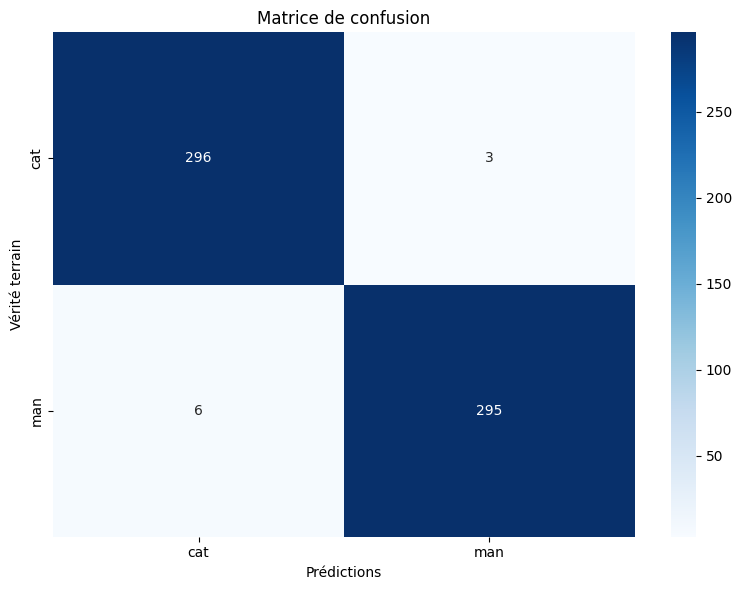

In [73]:
matrice()

# Resultats

## 1 - 1
kfold (ectart-type: 24.590)

## 3-1
0.505

## 6-1
0.969

## 1-3
1.381

## 3-3
1.784

## 6-3
0.827

## 1-6
0.693

## 3-6
1.165

## 6-6
1.555
